## Ensayos
### Miguel García
### Mariana León

In [ ]:
!pip install language_tool_python

In [ ]:
!python -m spacy download en_core_web_lg

In [ ]:
!pip install stanza

In [ ]:
!pip install fasttext

In [181]:
import pandas as pd
import numpy as np
import language_tool_python
import stanza
import re
import torch
import fasttext
import spacy
from spacy.lang.es.stop_words import STOP_WORDS
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
import gensim
from gensim import corpora, models
from gensim.models import Word2Vec
from gensim.models.word2vec import LineSentence
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from transformers import BertTokenizer, BertModel
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, SpatialDropout1D, Bidirectional, GRU, Input,Concatenate
from tensorflow.keras.layers import Embedding

In [ ]:
essay = pd.read_csv("training_set_rel3.tsv", sep='\t', encoding='ISO-8859-1')
essay = essay.get(["essay_id","essay_set","essay"])

## Procesamiento de los datos

### Corrección ortografica

In [ ]:
tool = language_tool_python.LanguageTool("en")

INFO:language_tool_python.download_lt:Unzipping /tmp/tmpl9u68nzh.zip to /root/.cache/language_tool_python.
INFO:language_tool_python.download_lt:Downloaded https://www.languagetool.org/download/LanguageTool-6.4.zip to /root/.cache/language_tool_python.


In [ ]:
%%time
essay["errores"] = essay["essay"].apply(lambda x: tool.check(x))
essay["Corregido"] = essay.apply(lambda c: language_tool_python.utils.correct(c["essay"], c["errores"]), axis = 1)

CPU times: user 1min 38s, sys: 4.97 s, total: 1min 43s
Wall time: 22min 59s


In [ ]:
essay.to_pickle('ensayos_corregido.pkl')

### Tokenización, lematización

In [ ]:
datos = pd.read_pickle('ensayos_corregido.pkl')
datos.head(2)

,essay_id,essay_set,essay,errores,Corregido
0,1,1,"Dear local newspaper, I think effects computer...","[Offset 186, length 1, Rule ID: SPACE_BEFORE_P...","Dear local newspaper, I think effects computer..."
1,2,1,"Dear @CAPS1 @CAPS2, I believe that using compu...","[Offset 272, length 4, Rule ID: SENT_START_CON...","Dear @CAPS1 @CAPS2, I believe that using compu..."


In [ ]:
%%time
sents = []
tokens = []
lemma = []
pos = []
ner = []

stop_words = set(STOP_WORDS)
nlp = spacy.load("en_core_web_lg")

for essay in nlp.pipe(datos['Corregido'], batch_size=100, n_process=4):
    if essay.is_parsed:
        tokens.append([e.text for e in essay])
        sents.append([sent.text.strip() for sent in essay.sents])
        pos.append([e.pos_ for e in essay])
        ner.append([e.text for e in essay.ents])
        lemma.append([n.lemma_ for n in essay])
    else:
        tokens.append(None)
        lemma.append(None)
        pos.append(None)
        sents.append(None)
        ner.append(None)

datos['tokens'] = tokens
datos['lemma'] = lemma
datos['pos'] = pos
datos['sents'] = sents
datos['ner'] = ner

<timed exec>:11: DeprecationWarning: [W107] The property `Doc.is_parsed` is deprecated. Use `Doc.has_annotation("DEP")` instead.


CPU times: user 1min 21s, sys: 4.02 s, total: 1min 25s
Wall time: 8min 35s


In [ ]:
%%time
datos['token_count'] = datos.apply(lambda x: len(x['tokens']), axis=1)
datos['unique_token_count'] = datos.apply(lambda x: len(set(x['tokens'])), axis=1)
datos['nostop_count'] = datos.apply(lambda x: len([token for token in x['tokens'] if token not in stop_words]), axis=1)
datos['sent_count'] = datos.apply(lambda x: len(x['sents']), axis=1)
datos['ner_count'] = datos.apply(lambda x: len(x['ner']), axis=1)
datos['comma'] = datos.apply(lambda x: x['Corregido'].count(','), axis=1)
datos['question'] = datos.apply(lambda x: x['Corregido'].count('?'), axis=1)
datos['exclamation'] = datos.apply(lambda x: x['Corregido'].count('!'), axis=1)
datos['quotation'] = datos.apply(lambda x: x['Corregido'].count('"') + x['Corregido'].count("'"), axis=1)
datos['organization'] = datos.apply(lambda x: x['Corregido'].count(r'@ORGANIZATION'), axis=1)
datos['caps'] = datos.apply(lambda x: x['Corregido'].count(r'@CAPS'), axis=1)
datos['person'] = datos.apply(lambda x: x['Corregido'].count(r'@PERSON'), axis=1)
datos['location'] = datos.apply(lambda x: x['Corregido'].count(r'@LOCATION'), axis=1)
datos['money'] = datos.apply(lambda x: x['Corregido'].count(r'@MONEY'), axis=1)
datos['time'] = datos.apply(lambda x: x['Corregido'].count(r'@TIME'), axis=1)
datos['date'] = datos.apply(lambda x: x['Corregido'].count(r'@DATE'), axis=1)
datos['percent'] = datos.apply(lambda x: x['Corregido'].count(r'@PERCENT'), axis=1)
datos['noun'] = datos.apply(lambda x: x['pos'].count('NOUN'), axis=1)
datos['adj'] = datos.apply(lambda x: x['pos'].count('ADJ'), axis=1)
datos['pron'] = datos.apply(lambda x: x['pos'].count('PRON'), axis=1)
datos['verb'] = datos.apply(lambda x: x['pos'].count('VERB'), axis=1)
datos['noun'] = datos.apply(lambda x: x['pos'].count('NOUN'), axis=1)
datos['cconj'] = datos.apply(lambda x: x['pos'].count('CCONJ'), axis=1)
datos['adv'] = datos.apply(lambda x: x['pos'].count('ADV'), axis=1)
datos['det'] = datos.apply(lambda x: x['pos'].count('DET'), axis=1)
datos['propn'] = datos.apply(lambda x: x['pos'].count('PROPN'), axis=1)
datos['num'] = datos.apply(lambda x: x['pos'].count('NUM'), axis=1)
datos['part'] = datos.apply(lambda x: x['pos'].count('PART'), axis=1)
datos['intj'] = datos.apply(lambda x: x['pos'].count('INTJ'), axis=1)

CPU times: user 5.24 s, sys: 17.4 ms, total: 5.26 s
Wall time: 5.39 s


In [54]:
datos = datos.rename(columns = {'Corregido':'essay_text'})

In [151]:
datos_features = datos.drop(columns = ['essay', 'errores', 'Corregido', 'tokens', 'lemma', 'pos', 'sents', 'ner'])

In [152]:
datos_features.to_pickle('ensayos_features.pkl')

### Procesamiento del texto

In [120]:
nltk.download('stopwords')
nltk.download('wordnet')
nlp = spacy.load("en_core_web_lg")

stop_nltk = stopwords.words('english')
stop_spacy = nlp.Defaults.stop_words
stop_todas = list(stop_spacy.union(set(stop_nltk)))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
%%time
datos['processed_text'] = datos.apply(lambda row:  ' '.join(token.lemma_ for token in nlp(row["essay_text"]).sents), axis=1)
datos['processed_text'] = datos['processed_text'].str.lower()
datos['processed_text'] = datos['processed_text'].replace(list('áéíóú'),list('aeiou'),regex=True)
datos['processed_text'] = datos['processed_text'].str.replace('[^\w\s]','')
datos['processed_text'] = datos['processed_text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_todas)]))

CPU times: user 11min 32s, sys: 1.69 s, total: 11min 33s
Wall time: 11min 43s


In [ ]:
datos.to_pickle("ensayos_procesados.pkl")

In [121]:
datos = pd.read_pickle('ensayos_procesados.pkl')

In [122]:
def lemmatize_stemming(text):
    ps = PorterStemmer()
    return ps.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
    return result

In [123]:
%%time
processed_docs = datos['processed_text'].map(preprocess)

CPU times: user 40.3 s, sys: 104 ms, total: 40.4 s
Wall time: 40.7 s


In [145]:
datos_proc = datos.get(["essay_id","essay_set"])
datos_proc["processed_docs"] = processed_docs

<ipython-input-145-6e8f616503bb>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_proc["processed_docs"] = processed_docs


In [146]:
datos_proc.to_pickle("ensayos_processed_docs.pkl")

## Nube de palabras con temas originales

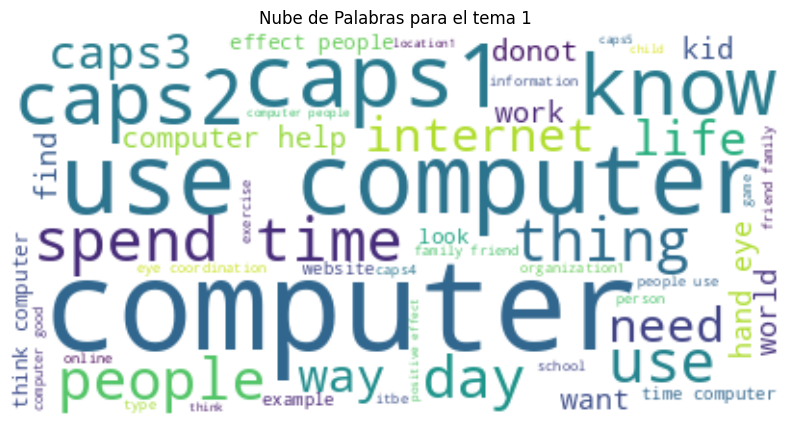

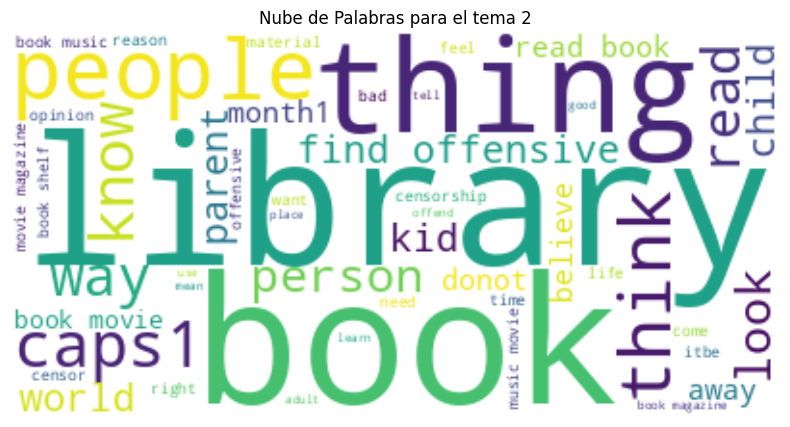

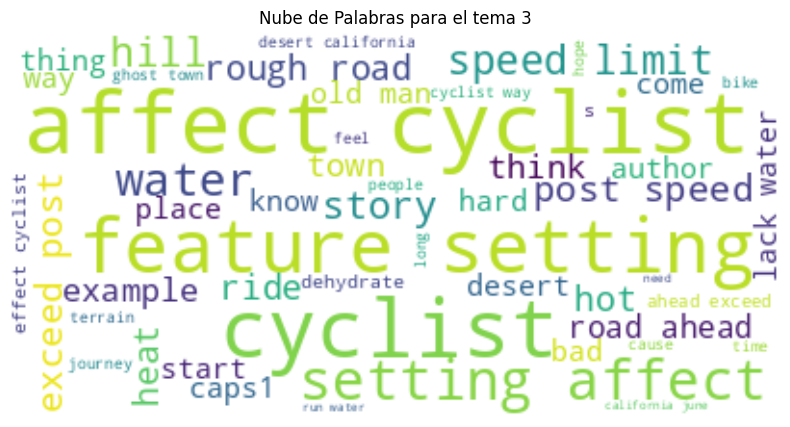

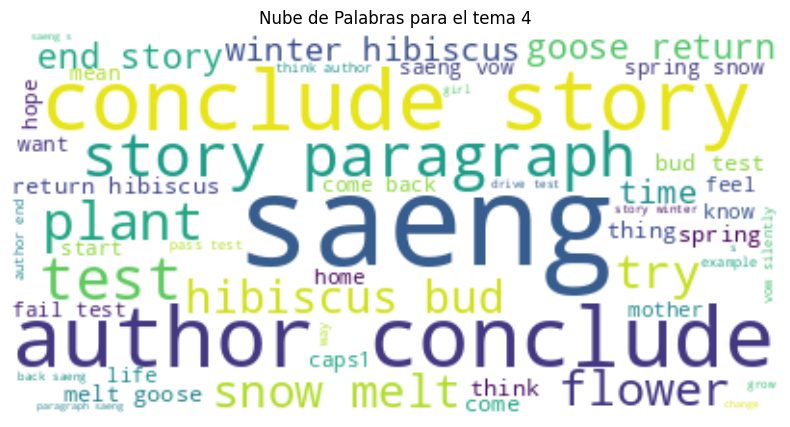

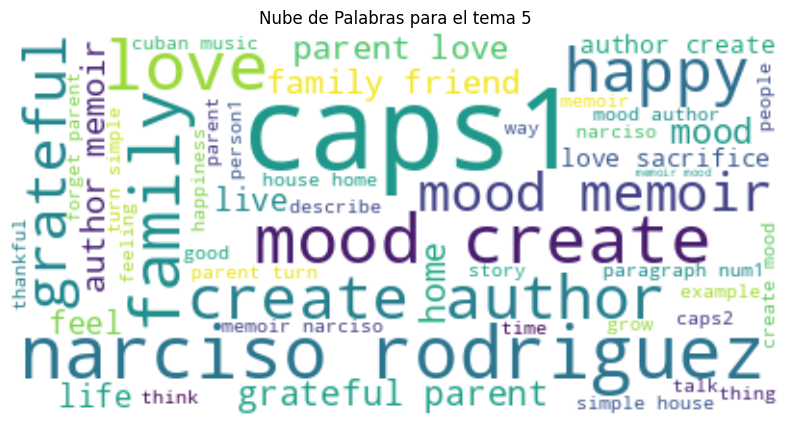

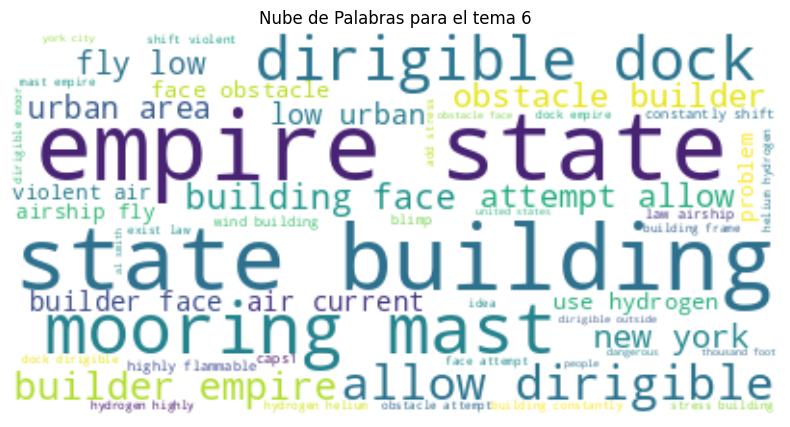

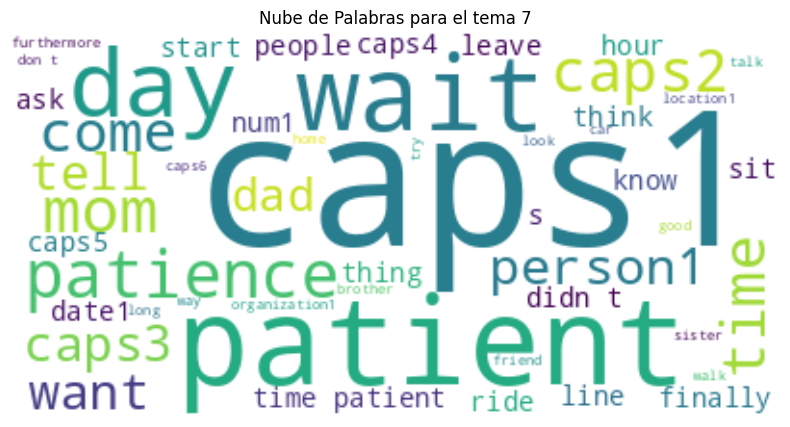

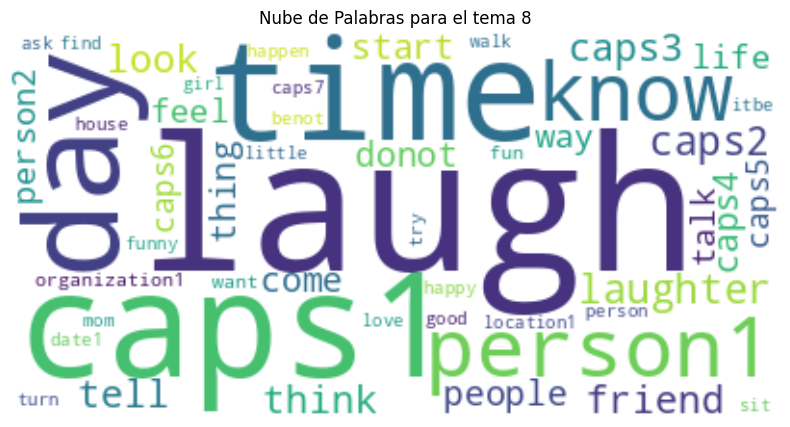

In [ ]:
temas = datos["essay_set"].unique()
for i in temas:
  cluster_texts = datos[datos['essay_set'] == i]['processed_text']
  wordcloud = WordCloud(max_words = 50, background_color = 'white').generate(' '.join(cluster_texts))

  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Nube de Palabras para el tema {i}')
  plt.show()

## Modelos

In [390]:
data = datos.get(["essay_id","essay_set"])

In [124]:
dictionary = gensim.corpora.Dictionary(processed_docs)

In [125]:
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=500)
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_docs]

### LDA sin TF-IDF

In [129]:
%%time
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=8, id2word=dictionary, passes=2, workers=2)

CPU times: user 15.1 s, sys: 566 ms, total: 15.6 s
Wall time: 28 s


In [43]:
ind_without_tfidf = lda_model[bow_corpus]

In [44]:
topics_wo = []
for y in range(datos.shape[0]):
    if len(ind_without_tfidf[y]) > 0:
        valid_sublist = [sublist for sublist in ind_without_tfidf[y] if len(sublist) > 1]
        if len(valid_sublist) > 0:
            max_index = np.argmax([sublist[1] for sublist in valid_sublist])
            topics_wo.append(valid_sublist[max_index][0])
        else:
            topics_wo.append(None)
    else:
        topics_wo.append(None)

In [391]:
datos["topic"] = topics_wo
data["topic_wo"] = topics_wo
topic_list = [x for x in datos["topic"].unique()]
topic_list = [x for x in np.sort(topic_list)]

<ipython-input-391-1ceda554dcc2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["topic_wo"] = topics_wo


In [ ]:
datos["topic"].value_counts()

,count
topic,
3,3449
1,2052
7,2006
6,1583
0,1561
4,1322
5,839
2,164


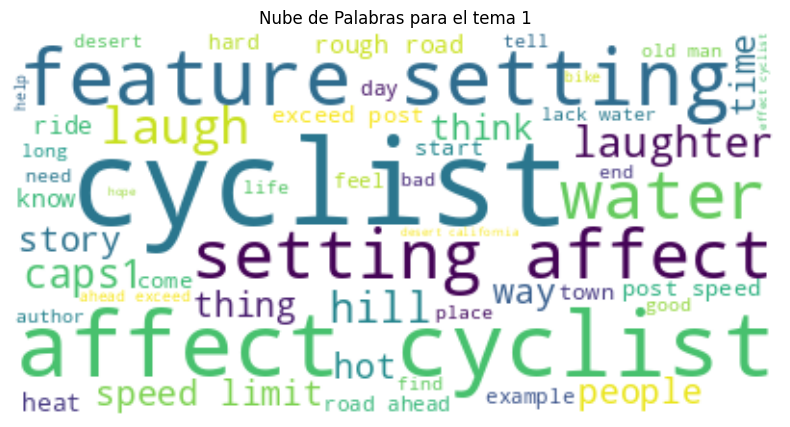

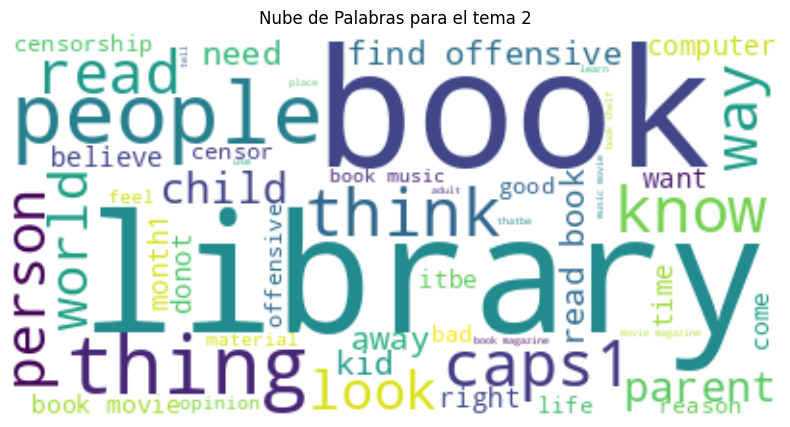

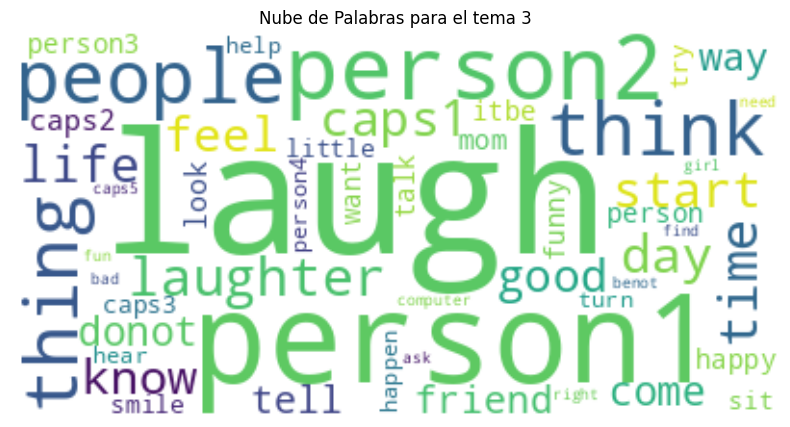

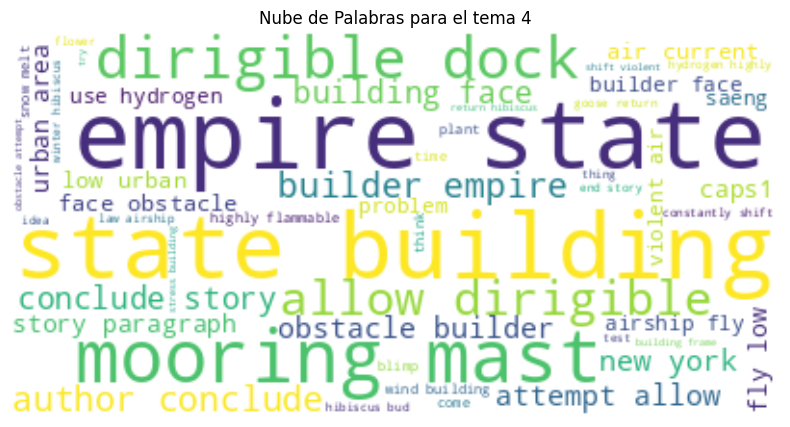

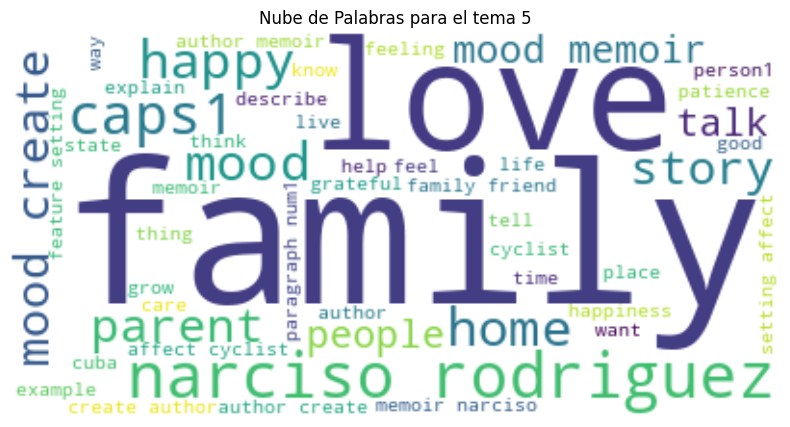

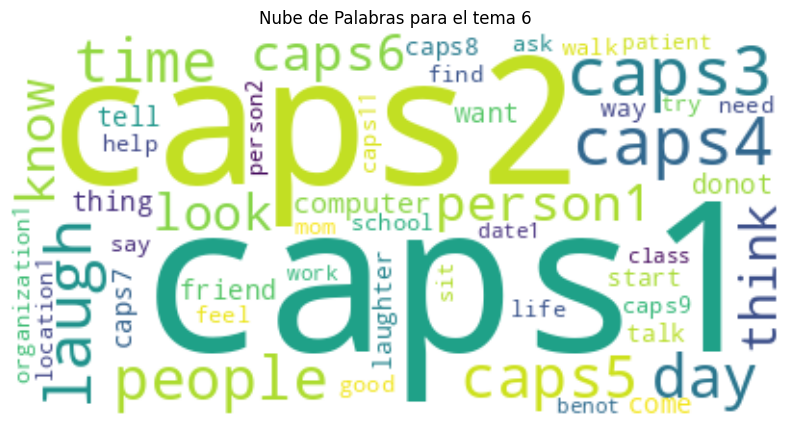

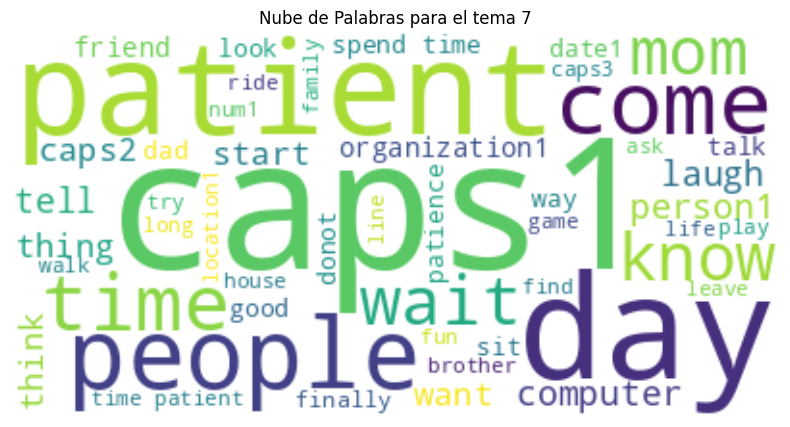

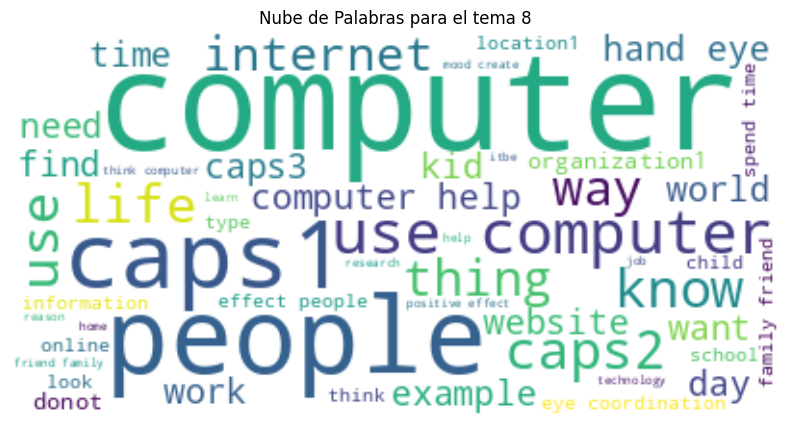

In [ ]:
for i in range(len(topic_list)):
  cluster_texts = data[data['topic_wo'] == i]['processed_text']
  wordcloud = WordCloud(max_words = 50, background_color = 'white').generate(' '.join(cluster_texts))

  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Nube de Palabras para el tema {1+i}')
  plt.show()

### LDA con TF-IDF

In [46]:
tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]

In [47]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus_tfidf, num_topics=8, id2word=dictionary, passes=2, workers=4)

In [ ]:
lda_model_tfidf.to_pickle("enayos_model_tfidf.pkl")

In [48]:
ind_with_tfidf = lda_model_tfidf[bow_corpus]

In [49]:
topics_w = []
for y in range(datos.shape[0]):
    if len(ind_with_tfidf[y]) > 0:
        valid_sublist = [sublist for sublist in ind_with_tfidf[y] if len(sublist) > 1]
        if len(valid_sublist) > 0:
            max_index = np.argmax([sublist[1] for sublist in valid_sublist])
            topics_w.append(valid_sublist[max_index][0])
        else:
            topics_w.append(None)
    else:
        topics_w.append(None)

In [392]:
datos["topic_tfidf"] = topics_w
data["topic_tfidf"] = topics_w
topic_list = [x for x in datos["topic_tfidf"].unique()]
topic_list = [x for x in np.sort(topic_list)]

<ipython-input-392-afef719c6c72>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["topic_tfidf"] = topics_w


In [ ]:
datos["topic_tfidf"].value_counts()

,count
topic_tfidf,
5,4805
7,2126
2,1791
6,1774
3,1271
4,1018
0,168
1,23


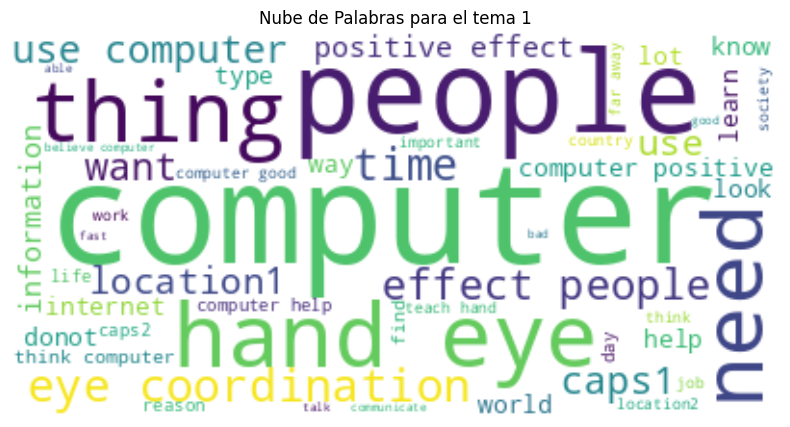

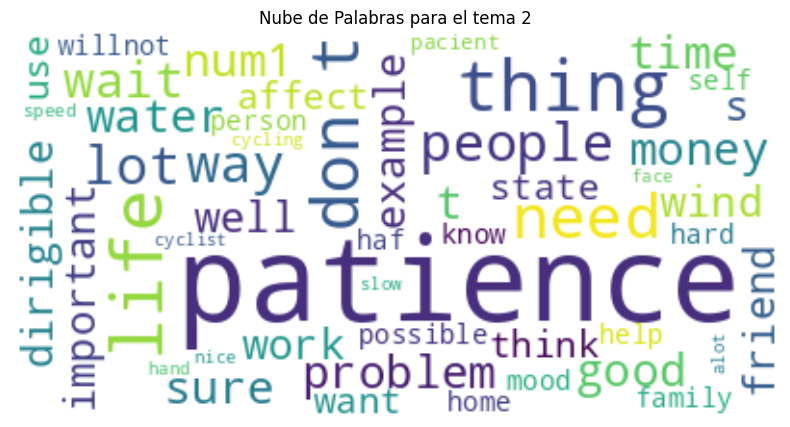

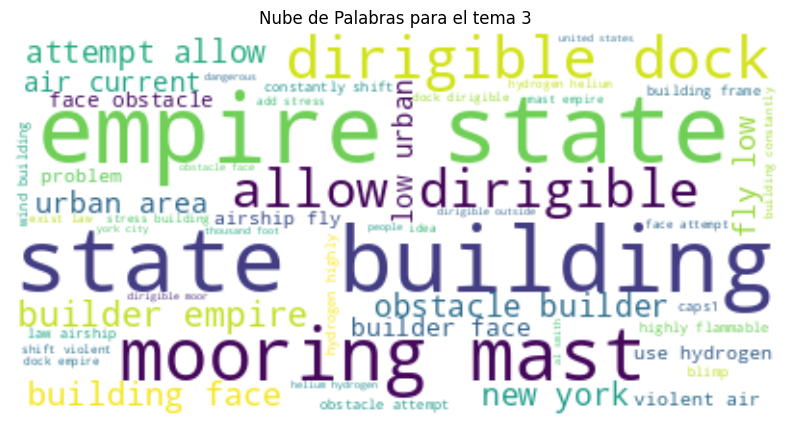

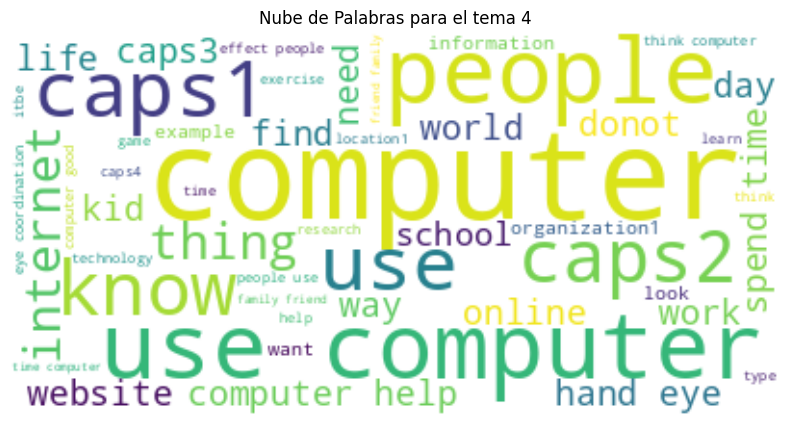

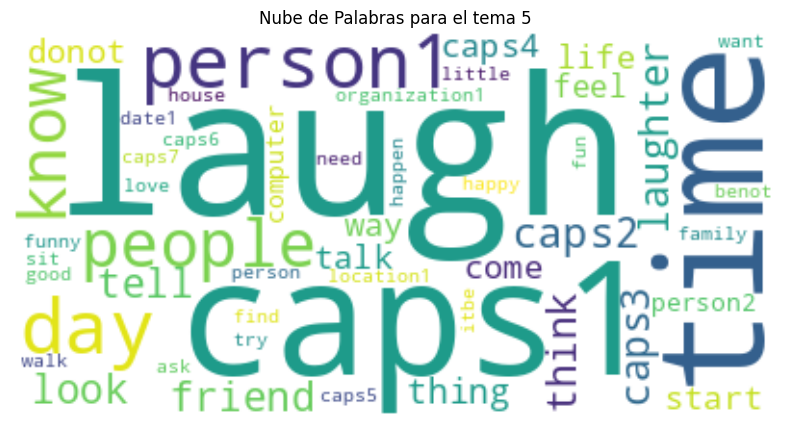

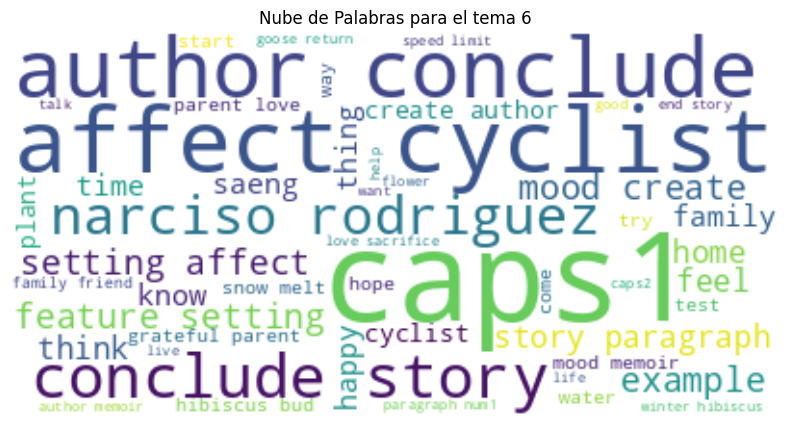

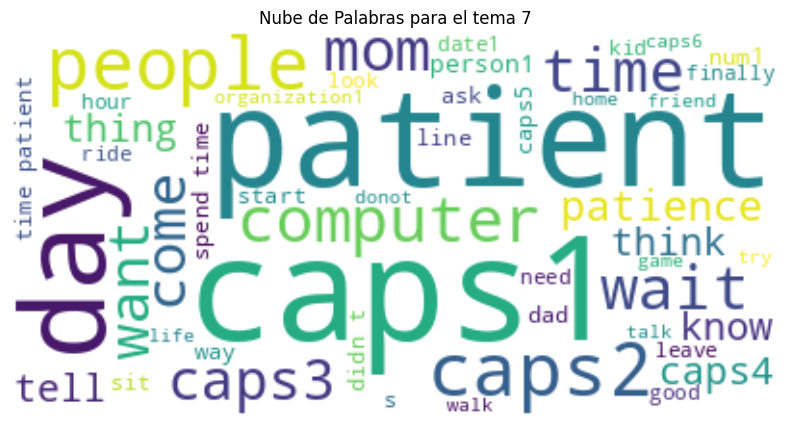

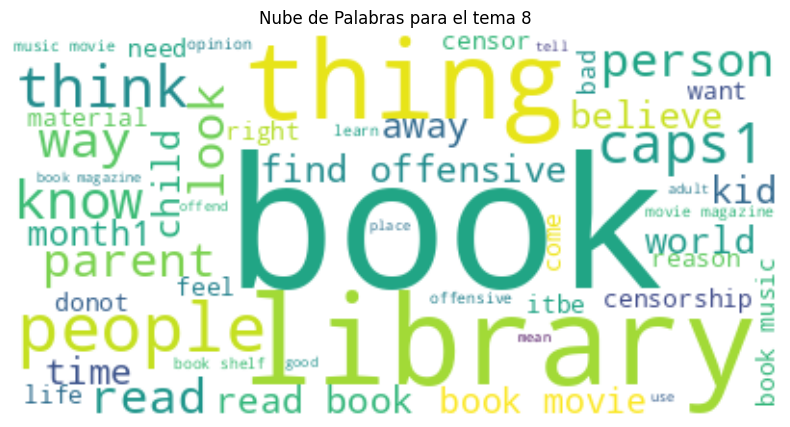

In [ ]:
for i in range(len(topic_list)):
  cluster_texts = data[data['topic_tfidf'] == i]['processed_text']
  wordcloud = WordCloud(max_words = 50, background_color = 'white').generate(' '.join(cluster_texts))

  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Nube de Palabras para el tema {1+i}')
  plt.show()

### Modelo Bert

In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [ ]:
def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    outputs = model(**inputs)
    cls_embedding = outputs.last_hidden_state[:, 0, :].detach().numpy()
    return cls_embedding.flatten()

In [ ]:
%%time
datos['bert_embedding'] = datos['processed_text'].apply(get_bert_embedding)
embeddings = np.stack(datos['bert_embedding'].values)

CPU times: user 1h 34min 38s, sys: 22.6 s, total: 1h 35min 1s
Wall time: 1h 35min 33s


In [ ]:
np.save("ensayos_embeddings.npy", embeddings)

In [51]:
embeddings = np.load("ensayos_embeddings.npy")

In [52]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(embeddings)

In [393]:
datos['cluster'] = kmeans.labels_
data["bert"] = datos["cluster"]
datos["cluster"].value_counts()

<ipython-input-393-b380fe103cef>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["bert"] = datos["cluster"]


,count
cluster,
4,3351
3,2297
0,2171
7,2145
2,1260
5,700
6,685
1,367


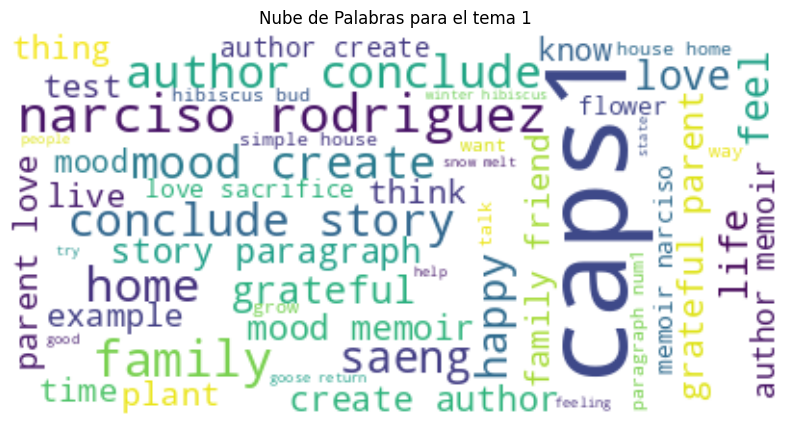

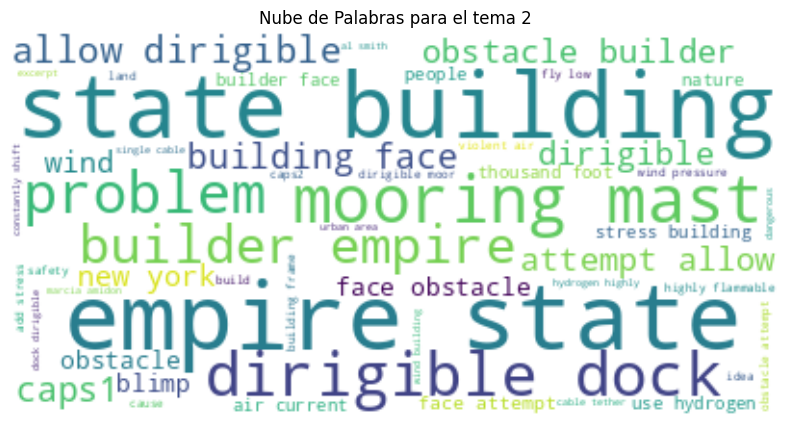

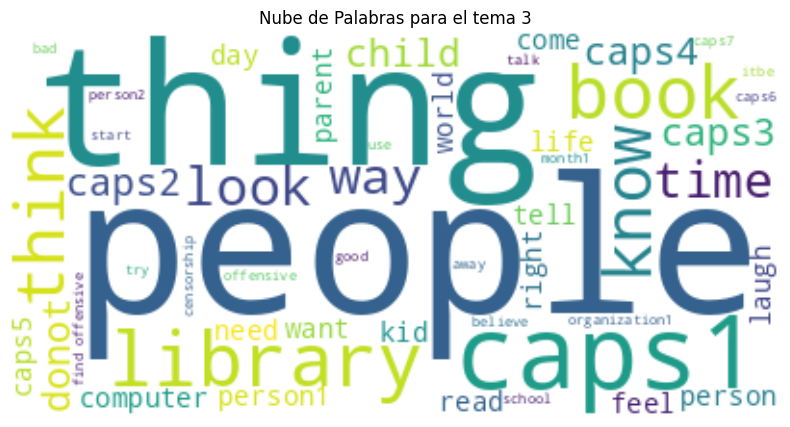

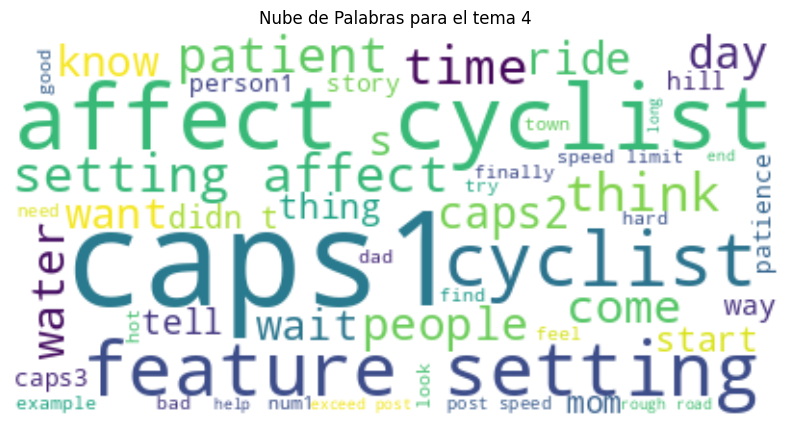

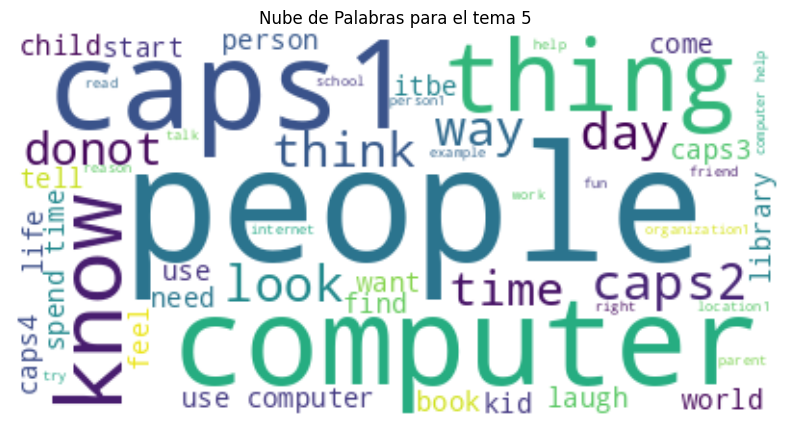

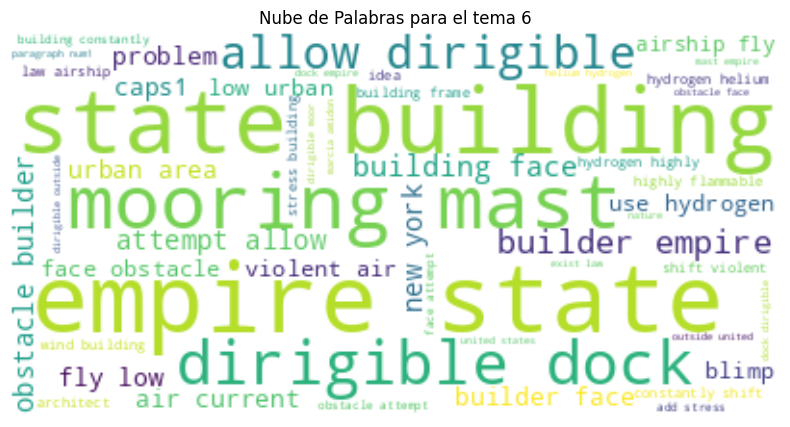

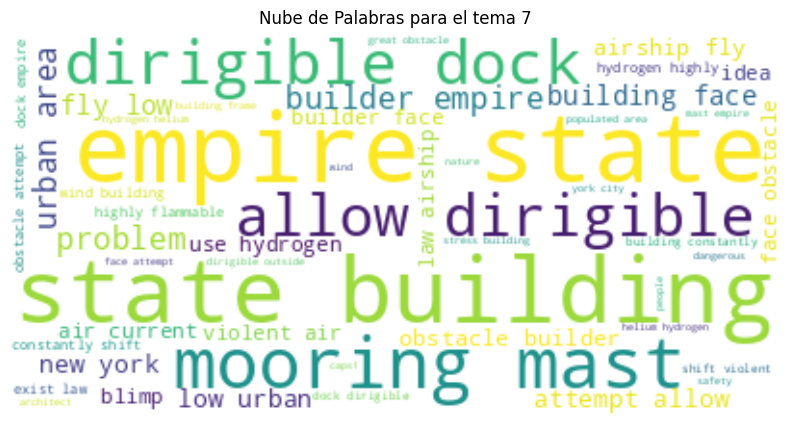

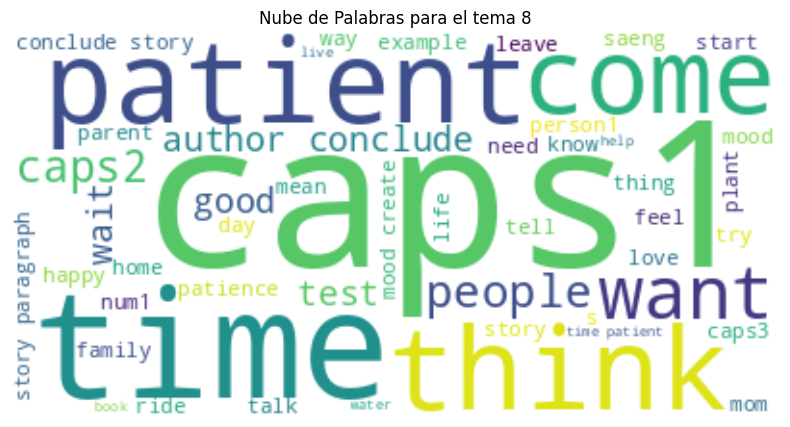

In [54]:
for i in range(kmeans.n_clusters):
  cluster_texts = data[data['bert'] == i]['processed_text']
  wordcloud = WordCloud(max_words = 50, background_color = 'white').generate(' '.join(cluster_texts))

  plt.figure(figsize=(10, 5))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Nube de Palabras para el tema {1+i}')
  plt.show()

### Fast Text

In [9]:
%%time
ft_model = fasttext.train_unsupervised('ensayos.csv',dim=300)

CPU times: user 14min 6s, sys: 2.73 s, total: 14min 8s
Wall time: 14min 22s


In [13]:
no_doc = np.random.randint(len(datos))
vocabulary = set(ft_model.words)

In [14]:
def doc_word_vectors(words, model, vocabulary, num_features):
    nwords = 0.
    no_found=[]
    doc=[]
    for word in words:
        if word in vocabulary:
            nwords = nwords + 1.
            doc.append(model.get_word_vector(word))
        else:
            no_found.append(word)
    return np.array(doc),no_found

In [15]:
def average_word_vectors(words, model, vocabulary, num_features):
    feature_vector = np.zeros((num_features,),dtype="float64")
    nwords = 0.
    for word in words:
        if word in vocabulary:
            nwords = nwords + 1.
            feature_vector = np.add(feature_vector, model.get_word_vector(word))
    if nwords:
        feature_vector = np.divide(feature_vector, nwords)
    return feature_vector

def averaged_word_vectorizer(corpus, model, num_features):
    vocabulary = set(model.words)
    features = [average_word_vectors(tokenized_sentence, model, vocabulary, num_features)
                    for tokenized_sentence in corpus]
    return np.array(features)

In [16]:
emb0, no_found = doc_word_vectors(datos['tokens'].iloc[no_doc], model=ft_model, vocabulary=vocabulary, num_features=ft_model.dim)

In [17]:
%%time
ftext_feature_array = averaged_word_vectorizer(corpus=datos['tokens'], model=ft_model, num_features=ft_model.dim)

CPU times: user 1min 4s, sys: 518 ms, total: 1min 5s
Wall time: 1min 22s


In [18]:
doc_embedding = pd.DataFrame(ftext_feature_array)

In [20]:
doc_embedding.to_csv('ensayos_embedding_fasttext.csv')

In [24]:
pca = PCA(n_components=30, random_state=0)
pcs = pca.fit_transform(doc_embedding.values)
scaler = StandardScaler()
scaled_pcs = scaler.fit_transform(pcs)

In [26]:
km = KMeans(n_clusters=8, random_state=0)
km.fit_transform(scaled_pcs)
cluster_labels = km.labels_
cluster_labels = pd.DataFrame(cluster_labels, columns=['Grupo'])

In [394]:
datos["FAST"] = km.labels_
data["FAST"] = km.labels_
cluster_labels.value_counts()

<ipython-input-394-a0af1468964d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["FAST"] = km.labels_


,count
Grupo,
2,2356
4,1835
0,1785
6,1785
7,1738
1,1690
3,1018
5,769


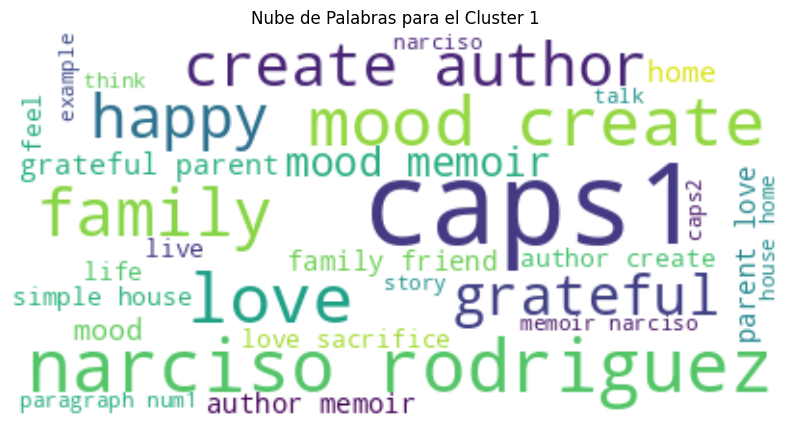

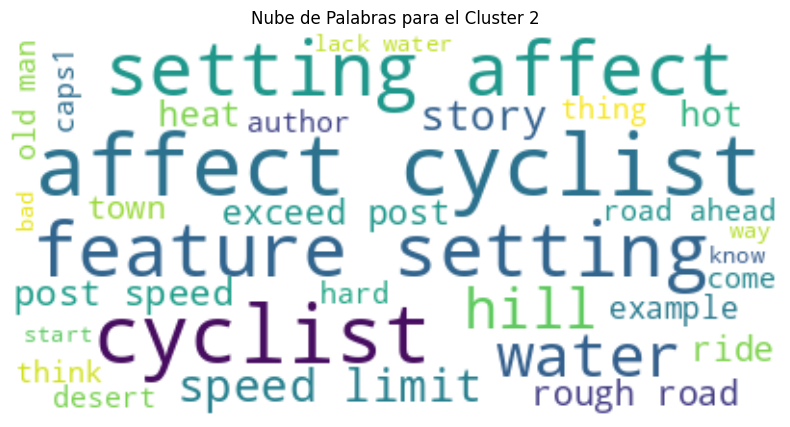

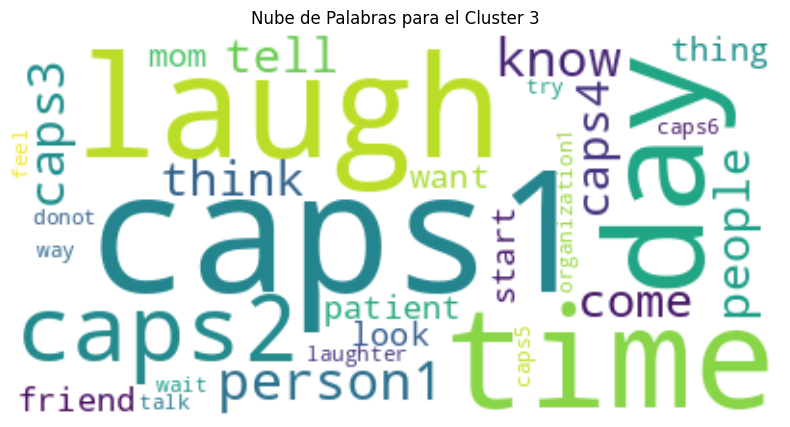

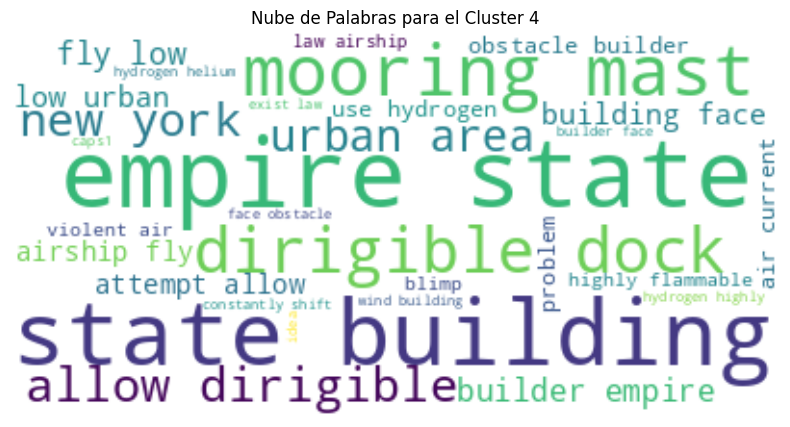

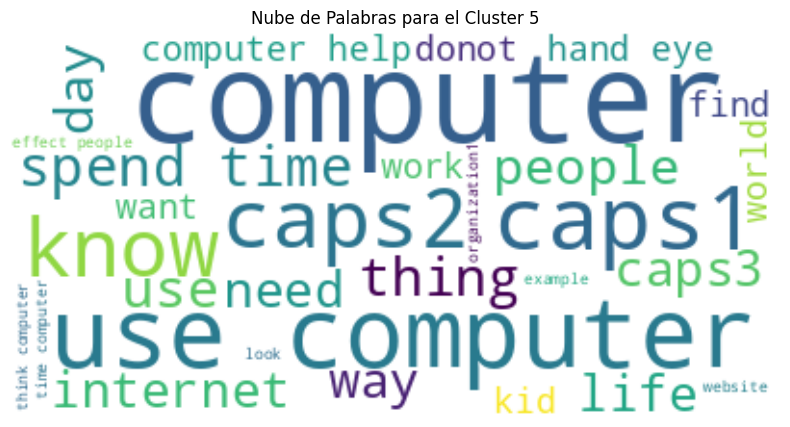

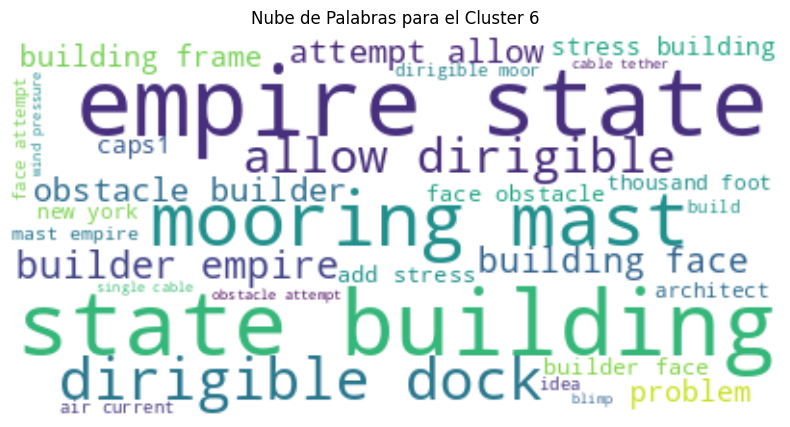

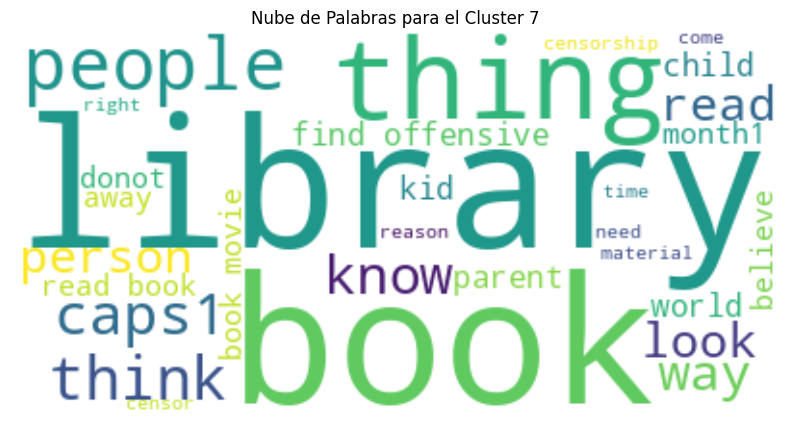

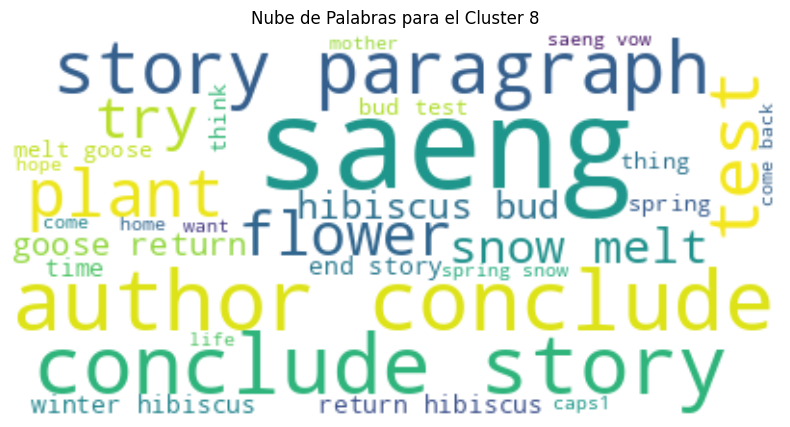

In [58]:
for i in range(km.n_clusters):
    cluster_texts = data[data['FAST'] == i]['processed_text']
    wordcloud = WordCloud(max_words=30, background_color='white').generate(' '.join(cluster_texts))

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Nube de Palabras para el Cluster {i+1}')
    plt.show()

## Evaluación de los modelos

In [440]:
data.to_pickle('ensayos_data.pkl')

In [7]:
data = pd.read_pickle("ensayos_data.pkl")

In [8]:
data.head(2)

,essay_id,essay_set,topic_wo,topic_tfidf,bert,FAST
0,1,1,6,4,4,4
1,2,1,6,4,4,4


In [9]:
data1 = data.get(["essay_id","essay_set"])
data1["topic_wo"] = data["topic_wo"] + 1
data1["topic_tfidf"] = data["topic_tfidf"] + 1
data1["bert"] = data["bert"] + 1
data1["FAST"] = data["FAST"] + 1
data1.head(2)

<ipython-input-9-3a097f8db678>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1["topic_wo"] = data["topic_wo"] + 1
<ipython-input-9-3a097f8db678>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1["topic_tfidf"] = data["topic_tfidf"] + 1
<ipython-input-9-3a097f8db678>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stabl

,essay_id,essay_set,topic_wo,topic_tfidf,bert,FAST
0,1,1,7,5,5,5
1,2,1,7,5,5,5


In [10]:
matriz_wo = pd.crosstab(data1["essay_set"],data1["topic_wo"])
matriz_tfidf = pd.crosstab(data1["essay_set"],data1["topic_tfidf"])
matriz_bert = pd.crosstab(data1["essay_set"],data1["bert"])
matriz_fast = pd.crosstab(data1["essay_set"],data1["FAST"])

In [11]:
tablas_cruzadas = [matriz_wo, matriz_tfidf, matriz_bert, matriz_fast]
resultados_totales = []

for matriz in tablas_cruzadas:
  categorias_usadas = set()
  asignaciones = {}

  for essay_set, row in matriz.iterrows():
    categorias_ordenadas = row.sort_values(ascending=False).index

    for categoria in categorias_ordenadas:
      if categoria not in categorias_usadas:
        asignaciones[essay_set] = categoria
        categorias_usadas.add(categoria)
        break
  resultado = pd.DataFrame(list(asignaciones.items()), columns=['essay_set', 'Categoria'])
  resultados_totales.append(resultado)

In [12]:
resultado = pd.merge(resultados_totales[0], resultados_totales[1], on = "essay_set", suffixes=('_wo', '_tfidf'))
resultado = pd.merge(resultado, resultados_totales[2], on = "essay_set")
resultado = pd.merge(resultado, resultados_totales[3], on = "essay_set", suffixes=('_bert', '_FAST'))

In [13]:
resultado

,essay_set,Categoria_wo,Categoria_tfidf,Categoria_bert,Categoria_FAST
0,1,7,5,5,5
1,2,5,2,3,7
2,3,8,1,4,2
3,4,6,8,1,8
4,5,2,4,8,1
5,6,4,7,6,4
6,7,1,6,2,3
7,8,3,3,7,6


In [14]:
listado = [1,2,3,4,5,6,7,8]
asignacion_wo = dict(zip(resultado["Categoria_wo"].values, listado))
asignacion_tfidf = dict(zip(resultado["Categoria_tfidf"].values, listado))
asignacion_bert = dict(zip(resultado["Categoria_bert"].values, listado))
asignacion_FAST = dict(zip(resultado["Categoria_FAST"].values, listado))

In [15]:
data_copia = data1.copy()
data_copia["topic_wo"] = data_copia["topic_wo"].replace(asignacion_wo)
data_copia["topic_tfidf"] = data_copia["topic_tfidf"].replace(asignacion_tfidf)
data_copia["bert"] = data_copia["bert"].replace(asignacion_bert)
data_copia["FAST"] = data_copia["FAST"].replace(asignacion_FAST)

### Accuracy Global

In [18]:
matriz1_wo = pd.crosstab(data_copia["essay_set"],data_copia["topic_wo"]).to_numpy()
matriz1_tfidf = pd.crosstab(data_copia["essay_set"],data_copia["topic_tfidf"]).to_numpy()
matriz1_bert = pd.crosstab(data_copia["essay_set"],data_copia["bert"]).to_numpy()
matriz1_fast = pd.crosstab(data_copia["essay_set"],data_copia["FAST"]).to_numpy()

In [19]:
acc_wo = np.diag(matriz1_wo).sum() * 100 / np.sum(matriz1_wo)
acc_tfidf = np.diag(matriz1_tfidf).sum() * 100 / np.sum(matriz1_tfidf)
acc_bert = np.diag(matriz1_bert).sum() * 100 / np.sum(matriz1_bert)
acc_fast = np.diag(matriz1_fast).sum() * 100 / np.sum(matriz1_fast)

print(f"El accuracy para cada modelo es:")
print(f"LDA sin TF-IDF:{acc_wo.round(2)}%")
print(f"LDA con TF-IDF:{acc_tfidf.round(2)}%")
print(f"Modelo Bert:{acc_bert.round(2)}%")
print(f"Modelo Fast Text:{acc_fast.round(2)}%")

El accuracy para cada modelo es:
LDA sin TF-IDF:59.93%
LDA con TF-IDF:67.05%
Modelo Bert:44.55%
Modelo Fast Text:87.31%


### Valores ROC

In [87]:
data_copia1 = data_copia.copy()
modelos = ("topic_wo","topic_tfidf","bert","FAST")
temas = data_copia1["essay_set"].unique()

y_true = []
y_test = []
for tema in temas:
  data_copia1.loc[data_copia["essay_set"]==tema, "essay_set"] = 1
  data_copia1.loc[data_copia["essay_set"]!=tema, "essay_set"] = 0

  y_true.append(list(data_copia1["essay_set"]))
  yest = []
  for modelo in modelos:
    data_copia1.loc[data_copia[modelo]==tema, modelo] = 1
    data_copia1.loc[data_copia[modelo]!=tema, modelo] = 0

    yest.append(list(data_copia1[modelo]))
  y_test.append(yest)

In [143]:
valores_ROC = pd.DataFrame({"TEMAS":["Tema 1","Tema 2","Tema 3","Tema 4","Tema 5","Tema 6","Tema 7","Tema 8"]})

for modelo in range(len(y_test[0])):
  roc = []
  for tema in range(len(y_test)):
    roc.append(roc_auc_score(y_true[tema], y_test[tema][modelo]).round(2))
  valores_ROC[f"MODELO {modelo}"] = roc

In [144]:
valores_ROC = valores_ROC.rename(columns = {'MODELO 0':'SIN TF-IDF', 'MODELO 1':'CON TF-IDF','MODELO 2':'MODELO BERT','MODELO 3':'FAST TEXT'})
valores_ROC

,TEMAS,SIN TF-IDF,CON TF-IDF,MODELO BERT,FAST TEXT
0,Tema 1,0.89,0.86,0.86,1.00
1,Tema 2,0.58,0.50,0.73,0.99
2,Tema 3,0.89,0.93,0.82,0.99
3,Tema 4,0.98,0.99,0.69,0.99
4,Tema 5,0.99,0.99,0.56,0.99
5,Tema 6,0.44,1.00,0.69,0.78
6,Tema 7,0.55,0.48,0.48,0.96
7,Tema 8,0.88,0.50,0.47,0.47


## Red neuronal FCNN

### Procesamiento de los datos

In [153]:
datos_features = pd.read_pickle('ensayos_features.pkl')

In [162]:
doc_embedding = pd.read_csv("ensayos_embedding_fasttext.csv")

In [211]:
datos_features["essay_set"] = datos_features["essay_set"] - 1

In [236]:
X_provisional = datos_features.get(["essay_id","token_count"])
y_provisional = datos_features.get(["essay_set"]).to_numpy()
X_train, X_test, y_train, y_test = train_test_split(X_provisional,y_provisional,test_size = 0.10,stratify = y_provisional)

In [237]:
index_train = X_train.index
index_test = X_test.index

In [238]:
X = datos_features.drop(columns=['essay_id', 'essay_set'])
y = datos_features["essay_set"]

In [239]:
features_train = X.iloc[index_train,]
embeddings_train = doc_embedding.iloc[index_train,]
y_train = y.iloc[index_train,]

features_test = X.iloc[index_test,]
embeddings_test = doc_embedding.iloc[index_test,]
y_test = y.iloc[index_test,]

In [240]:
scaler = MinMaxScaler((-1.0,1.0))

features_train_scaled = pd.DataFrame(scaler.fit_transform(features_train))
features_train_scaled.columns = features_train.columns
features_test_scaled = pd.DataFrame(scaler.fit_transform(features_test))
features_test_scaled.columns = features_test.columns

### Creación de la red

In [262]:
doc_embedding.shape[1]

301

In [263]:
embeddings_train.shape[1]

301

In [249]:
clases = len(y_train.unique())
x1 = Input(shape=(doc_embedding.shape[1],), name='Input_Embedding')
x2 = Input(shape=(features_train_scaled.shape[1],), name='Input_Features')

x = Concatenate(name='Concatenar')([x1, x2])

x = Dense(64, activation='elu', name='Capa_Densa_1')(x)
x = Dense(32, activation='elu', name='Capa_Densa_2')(x)
x = Dense(16, activation='elu', name='Capa_Densa_3')(x)

x = Dense(clases, activation='softmax', name='Output')(x)

model = Model(inputs=[x1, x2], outputs=x)
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [250]:
%%time
history = model.fit(x = [embeddings_train,features_train_scaled],
                    y = y_train,
                    validation_data = ([embeddings_test,features_test_scaled],y_test),
                    epochs=100,
                    batch_size=32,verbose=1)

Epoch 1/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.1858 - loss: 13.0521 - val_accuracy: 0.2766 - val_loss: 1.7199
Epoch 2/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.2797 - loss: 1.6979 - val_accuracy: 0.3860 - val_loss: 1.5511
Epoch 3/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3164 - loss: 1.6252 - val_accuracy: 0.4006 - val_loss: 1.4033
Epoch 4/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3776 - loss: 1.4464 - val_accuracy: 0.3767 - val_loss: 1.4043
Epoch 5/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3736 - loss: 1.4248 - val_accuracy: 0.4153 - val_loss: 1.3060
Epoch 6/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3962 - loss: 1.3616 - val_accuracy: 0.4076 - val_loss: 1.3291
Epoch 7/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3952 - loss: 1.3899 - val_accuracy: 0.4792 - val_loss: 1.1865
Epoch 8/100
365/365 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.3894 - loss: 1.5058 - val_acc

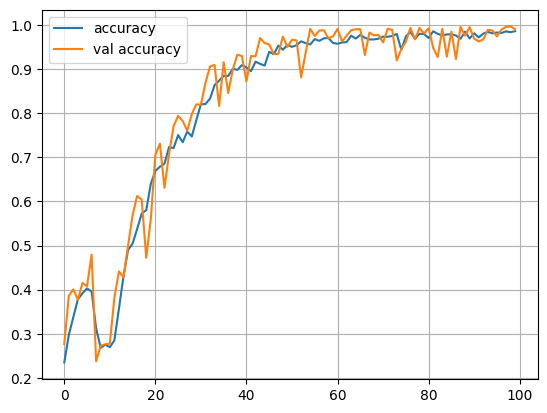

In [251]:
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.legend()
plt.grid()
plt.show()

In [260]:
train_accuracy = round(history.history['accuracy'][-1],2)
test_accuracy = round(history.history['val_accuracy'][-1],2)

In [261]:
print(f"El accuracy para el conjutno de entrenamiento es de {train_accuracy}%")
print(f"El accuracy para el conjutno de prueba es de {test_accuracy}%")

El accuracy para el conjutno de entrenamiento es de 0.99%
El accuracy para el conjutno de prueba es de 0.99%
